# 2020-08-11

## Analyzing Rpb1-MS2 movies



In [2]:
# Import public packages.
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi 
from importlib import reload
import pickle
import czifile
%matplotlib inline

# Import my packages.
import sys
sys.path.append('/Users/michaelstadler/Bioinformatics/Projects/rpb1/bin')
import imagep as imp
reload(imp)
from imagep import viewer, save_pickle, load_pickle, box_spots, read_czi

In [3]:
from random import random
def random_spot_data(spot_data, mask, n):
    """Produce spot_data for spots in random positions within nuclei, constrained by HLB mask"""
    rand_spot_data = {}
    for spot in spot_data:
        rand_spot_data[spot] = np.ndarray((spot_data[spot].shape[0] * n, spot_data[spot].shape[1]))
        rownum=0
        arr = spot_data[spot]
        for row in arr:
            t, nuc, z = [int(x) for x in row[0:3]]
            x,y = np.where(mask[t,z] == nuc)
            numpix = len(x)
            for i in range(0, n):
                rand = int(numpix * random())
                randx, randy = x[rand], y[rand]
                newrow = row.copy()
                newrow[3:5] = [randx, randy]
                rand_spot_data[spot][rownum] = newrow
                rownum = rownum + 1
    return rand_spot_data
#e=random_spot_data(mv.spot_data, np.where(a, 0, mv.nucmask),2)

In [4]:
mv1 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20200825-rpb1Snams2-em1-zsmv-03-05.pkl')

#mv2 = load_pickle('/Users/MStadler/Bioinformatics/Projects/Zelda/Quarantine_analysis/results/20200811-em2-zsmv-0405stitch.pkl')

#mv3 = load_pickle('/Users/MStadler/Bioinformatics/Projects/Zelda/Quarantine_analysis/results/20200811-em1-zsmv-03.pkl')





In [5]:
from scipy.interpolate import interp1d
from scipy.signal import savgol_filter

def plot_prot_ms2_multspots(mv):
    """savgol smoothing"""
    num_to_plot= mv.intvol.shape[1]

    def plot(x, col):
        norm = (x - x.min()) / (x.max() - x.min())
        indexes = norm.index
        values = norm.values
        xx = np.linspace(indexes.min(),indexes.max(), 800)
        itp = interp1d(indexes,values, kind='linear')
        window_size, poly_order = 51, 3
        yy_sg = savgol_filter(itp(xx), window_size, poly_order)
        plt.scatter(indexes, values, marker="o", color=col)
        plt.plot(xx,yy_sg, color=col)

    def test(x):
        plot(mv.intvol[x], "blue")
        plot(mv.prot[x], "orange")
        #norm(mv.intvol[x]).plot(marker="o") #blue
        #norm(mv.intfit[x]).plot(marker="o") #orange
        #norm(mv.prot[x]).plot(marker="o") #orange

        plt.title(x)
    imp.plot_ps(test, range(1,num_to_plot+1))

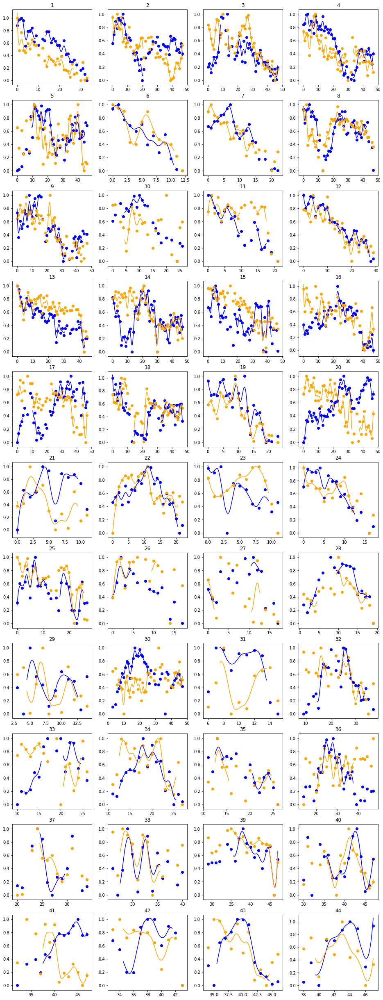

In [59]:
plot_prot_ms2_multspots(mv1)

In [4]:
def plot_prot_ms2_multspots3(mv):
    """original, ironically"""
    num_to_plot= mv.intvol.shape[1]
    windowsize = 5
    
    def norm(data):
        data_norm = (data - data.min()) / (data.max() - data.min())
        return(data_norm)
    
    def test(x):
        data1 = norm(mv.intvol[x])
        data2 = norm(mv.prot[x])
        data1.plot(marker="o", color="blue") 
        data2.plot(marker="o", color="orange") 
        plt.title(x)
        
    imp.plot_ps(test, range(1,num_to_plot+1))

plot_prot_ms2_multspots3(mv3)

NameError: name 'mv3' is not defined

In [110]:
reload(imp)
imp.quickview_ms2(mv3.stack, mv3.spot_data, 0, 26)

interactive(children=(Dropdown(description='Color', index=8, options=('gray_r', 'viridis', 'cividis', 'magma',…

### Overall MS2 vs. Rpb1 correlations

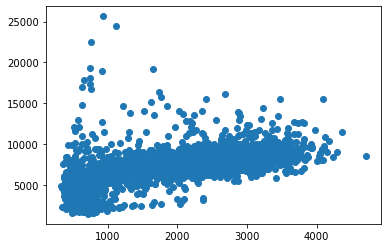

In [6]:
# integrated MS2 signal vs. protein (just all spots) for mv1
plt.scatter(mv1.intvol, mv1.prot)

In [7]:
# integrated MS2 signal vs. protein (just all spots) for mv3
plt.scatter(mv3.intvol, mv3.prot)

NameError: name 'mv3' is not defined

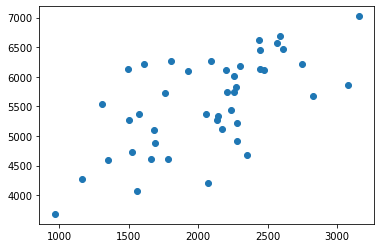

In [89]:
# Mean spot MS2 intensity vs. protein intensity (one dot per spot) for mv1
plt.scatter(mv1.intvol.mean(axis=0), mv1.prot.mean(axis=0))

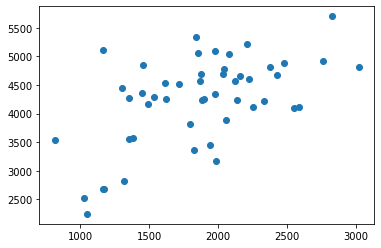

In [90]:
# Mean spot MS2 intensity vs. protein intensity (one dot per spot) for mv3
plt.scatter(mv3.intvol.mean(axis=0), mv3.prot.mean(axis=0))

In [93]:
from scipy.stats import spearmanr
spearmanr(mv1.intvol.mean(axis=0), mv1.prot.mean(axis=0))

SpearmanrResult(correlation=0.5968992248062015, pvalue=1.8966593650293102e-05)

In [94]:
spearmanr(mv3.intvol.mean(axis=0), mv3.prot.mean(axis=0))

SpearmanrResult(correlation=0.45, pvalue=0.0011780517169957757)

Looks like there's a real (but not super strong) positive correlation between Rpb1 intensity and MS2 intensity. Curious what it looks like if we put the data for these two together (looking at spot means):

SpearmanrResult(correlation=0.5202023216257348, pvalue=9.076378586065516e-08)

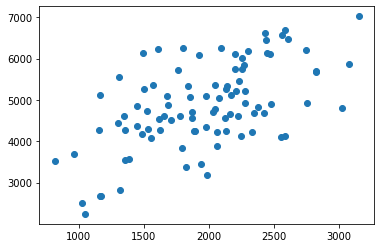

In [106]:
from pandas import concat
intvol = concat([mv1.intvol.mean(axis=0), mv3.intvol.mean(axis=0)])
prot = concat([mv1.prot.mean(axis=0), mv3.prot.mean(axis=0)])
plt.scatter(intvol, prot)
spearmanr(intvol,prot)

Looks about the same.

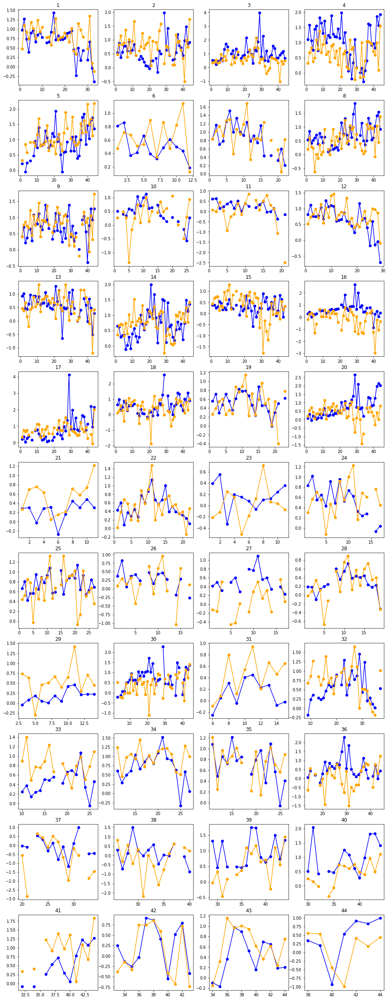

In [111]:
def plot_prot_ms2_multspots4(mv):
    """Normalize to average signal"""
    num_to_plot= mv.intvol.shape[1]
    windowsize = 5
    
    def norm(data, x):
        data_norm = (data[x] - data.min()) / (data.max() - data.min())
        return(data_norm)
    
    def test(x):
        data1 = norm(mv.intvol, x)
        data2 = norm(mv.prot, x)
        data1.plot(marker="o", color="blue") 
        data2.plot(marker="o", color="orange") 
        plt.title(x)
        
    imp.plot_ps(test, range(1,num_to_plot+1))

plot_prot_ms2_multspots4(mv1)

In [116]:
#imp.quickview_ms2(mv1.stack, mv1.spot_data, 1, 43)

### Testing integration volumes

Seems like a good time to circle back and look at the effect of using different integration volumes. I never put a lot of work into this, just tried something reasonable and moved on. Now that I have a little more experience looking at these curves, I thought I would compare different volumes and see what happens.

Wrote this to make a little dict of dicts for a range of integration radii (in Z and IJ).

In [151]:
mv = mv1
ij_scale = 85
z_scale = 660
spotchannel = 1

rads = {}
for z_rad in range(0,3):
    rads[z_rad] = {}
    z_rad_adj = z_rad
    if (z_rad == 0):
        z_rad_adj = 0.01
    for ij_rad in range(1, 12, 2):
        temp = imp.add_volume_mean(mv.spot_data, mv.stack, spotchannel, ij_rad, z_rad_adj, ij_scale, z_scale)
        rads[z_rad][ij_rad] = imp.movie.make_spot_table(temp, mv.nucmask, -1)


Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40


In [245]:
rads = load_pickle('/Users/MStadler/Bioinformatics/Projects/Zelda/Quarantine_analysis/results/20200811-em1-zsmv-06-testing-intvol-radii.pkl')

In [159]:
# Save data since these take a while to calculate.
save_pickle(rads, '/Users/MStadler/Bioinformatics/Projects/Zelda/Quarantine_analysis/results/20200811-em1-zsmv-06-testing-intvol-radii.pkl')

In [9]:
def plot_traces_base(table1, table2, windowsize=1):
    """Compare two integrations, normalize each trace 0 to 1"""
    num_to_plot= table1.shape[1]
    
    def norm(data, x):
        data_norm = (data[x] - data[x].min()) / (data[x].max() - data[x].min())
        return(data_norm)
    
    def test(x):
        data = norm(table1, x).rolling(windowsize, center=True).mean()
        data.plot(marker="o", color="blue") 
        #data2 = norm(table2, x)
        data2 = norm(table2, x).rolling(windowsize, center=True).mean()
        data2.plot(marker="p", color="orange")
        plt.title(x)
        
    imp.plot_ps(test, range(1,num_to_plot+1))


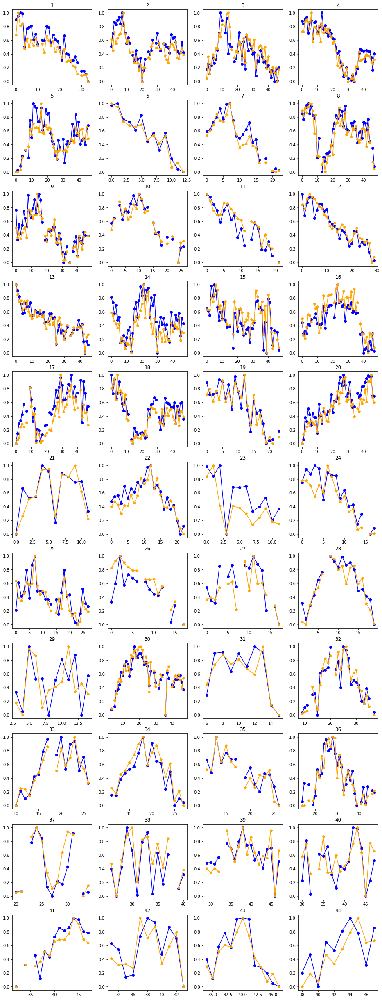

In [251]:
plot_traces(rads[0][5], rads[2][5])

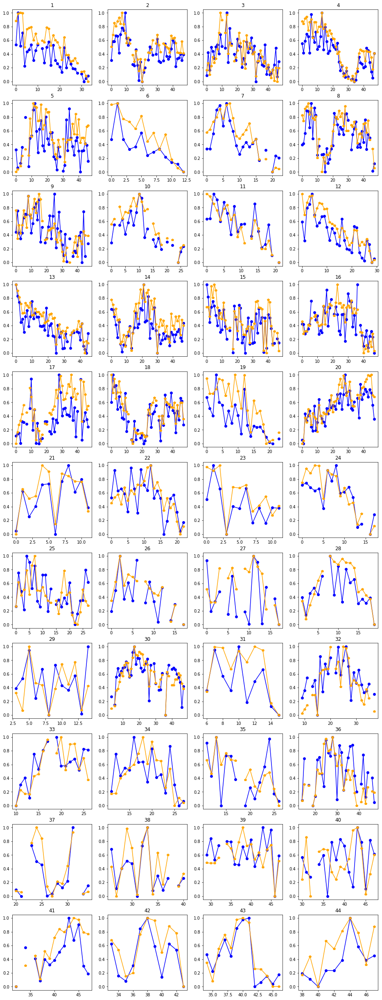

In [252]:
plot_traces(rads[1][1], rads[1][5])

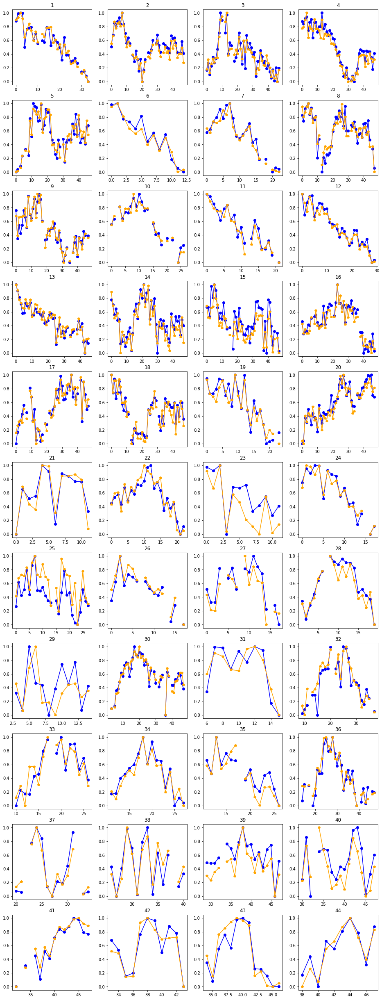

In [253]:
plot_traces(rads[1][5], rads[1][11])

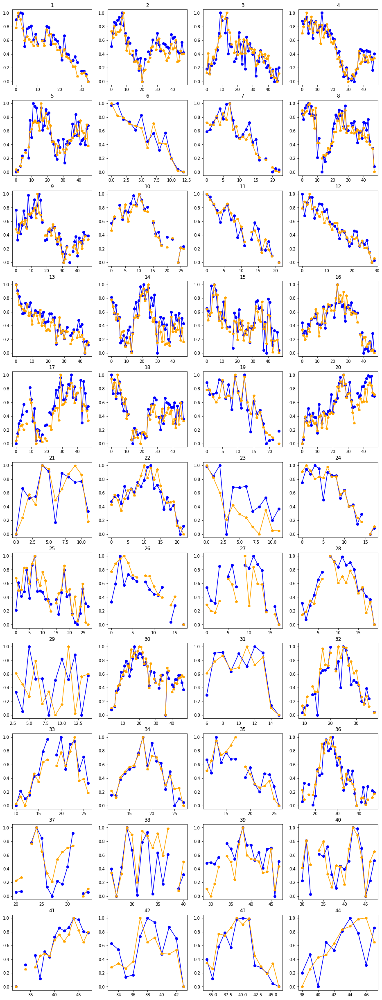

In [254]:
plot_traces(rads[0][5], rads[2][11])

### Conclusions for MS2
1. Going from very small volumes to larger volumes makes a significant difference in trace details, but overall trends stay the same.
2. Once you get to a decent sized volume, integrating over a larger space doesn't make a huge difference (say going from 1x11 to 3x23).

### What about protein?

Will run the same with protein.

In [175]:
mv = mv1
ij_scale = 1
z_scale = 1
channel = 0

p_rads = {}
for z_rad in range(0,3):
    p_rads[z_rad] = {}
    z_rad_adj = z_rad
    if (z_rad == 0):
        z_rad_adj = 0.01
    for ij_rad in range(1, 12, 2):
        temp = imp.add_volume_mean(mv.spot_data, mv.stack, channel, ij_rad, z_rad_adj, ij_scale, z_scale)
        p_rads[z_rad][ij_rad] = imp.movie.make_spot_table(temp, mv.nucmask, -1)

Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40
Processed 10
Processed 20
Processed 30
Processed 40


In [177]:
# Save data since these take a while to calculate.
save_pickle(p_rads, '/Users/MStadler/Bioinformatics/Projects/Zelda/Quarantine_analysis/results/20200811-em1-zsmv-06-testing-prot-radii.pkl')

In [255]:
p_rads = load_pickle('/Users/MStadler/Bioinformatics/Projects/Zelda/Quarantine_analysis/results/20200811-em1-zsmv-06-testing-prot-radii.pkl')

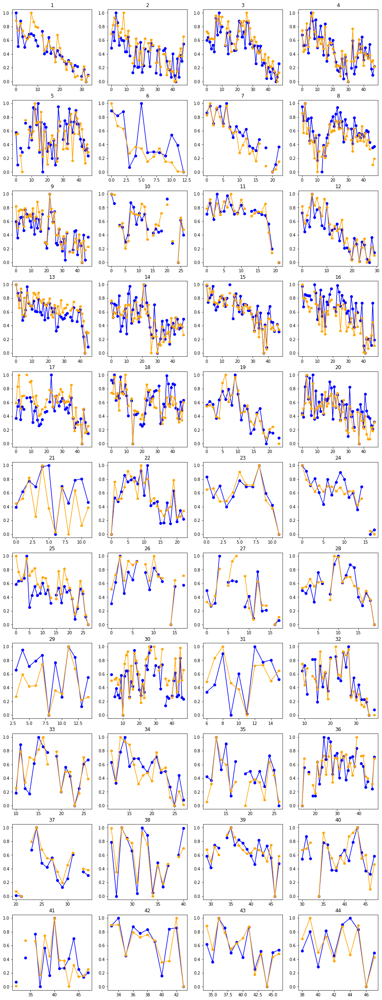

In [256]:
# Go from 1 z-slice to 3 z-slices
plot_traces(p_rads[0][3], p_rads[2][3])

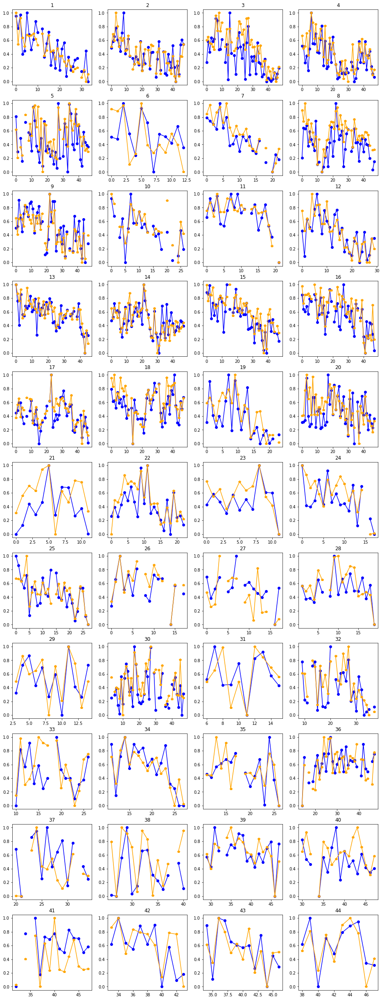

In [257]:
plot_traces(p_rads[1][1], p_rads[1][3])

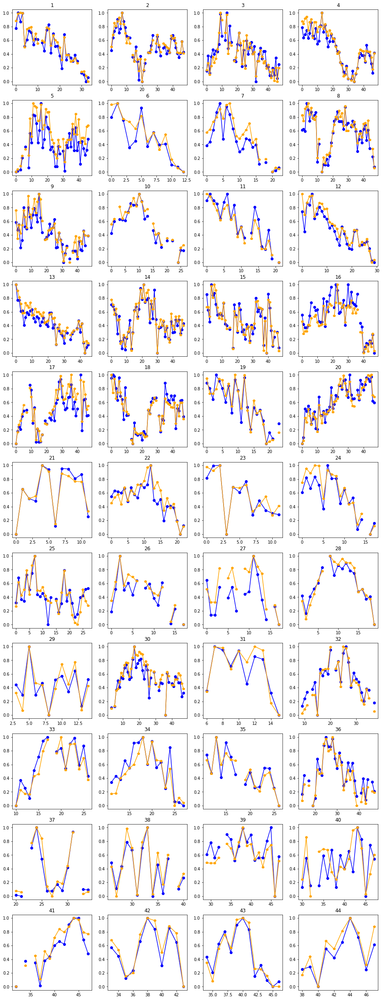

In [258]:
plot_traces(rads[1][3], rads[1][5])

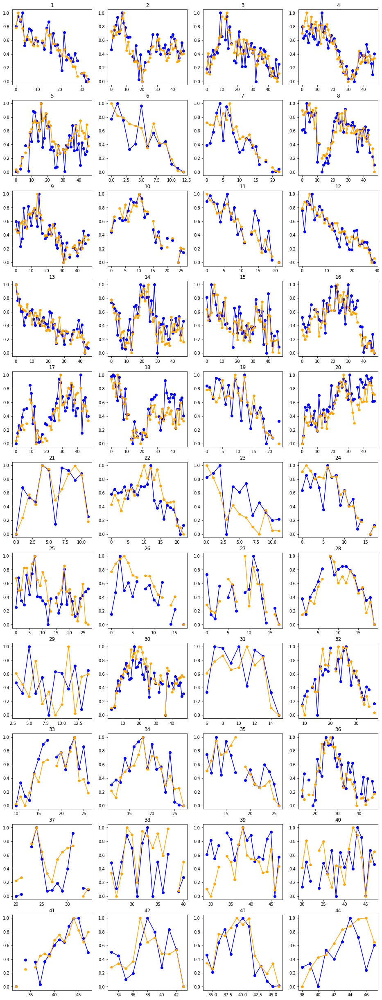

In [259]:
plot_traces(rads[0][3], rads[2][11])

### Conclusions for protein

1. Resolved some of the z_rad issues...but the conclusion is the (surprising) same: adding an extra Z slice doesn't change a whole lot. One thing to remember here is we're doing an ellipse not a box (may be wrong), so the +1 and -1 slices contribute fewer pixels than the center slice.
2. Changes the ij radius (beyond a radius of 1) have surprisingly little effect. I think I expected using a larger protein radius to give a big change, but really all the overall trends seem pretty consistent even with 3x23 ellipses.
3. There's of course no "right" answer, but this analysis convinces me that different values in this range give subtly different outputs, but that there isn't any point in this range that is obviously wrong. I didn't find a point where all the sudden the signal levels diverged by a huge amount. It's worth thinking on what that means, but overall values in this range give outputs that are reasonably compatible with each other.

Confused as to why changing Z from 0 to 1 makes so little difference...grabbed this code from inside add_volume_mean to test.

In [216]:
test = mv1.stack[1,0]
mesh = imp.mesh_like(test,3)
def ellipsoid_make(coords, stack, meshgrid, ij_rad=5, z_rad=1.1):
        """Define ellipsoid around point, return mean of pixel values in ellipsoid."""
        # Equation: (x-x0)^2 + (y-y0)^2 + a(z-z0)^2 = r^2
        r = ij_rad # r is just more intuitive for me to think about...
        a = (r ** 2) / (z_rad ** 2)
        z0, i0, j0 = coords
        valsgrid = np.sqrt((a * ((meshgrid[0] - z0) ** 2)) + ((meshgrid[1] - i0) ** 2) + ((meshgrid[2] - j0) ** 2))
        return np.where(valsgrid <= r, 40000, stack)
    
viewer(ellipsoid_make((5,200,200),test, mesh), figsize=12)

interactive(children=(Dropdown(description='Color', index=2, options=('gray_r', 'cividis', 'viridis', 'magma',…

Ahh. It turns out that the behavior isn't quite what I expected. z_rad of 0 (0.05) and 1 makes an ellipse 1 pixel thick (radius of 0). What's interesting is that z_rad of 0 and 1 don't give *exactly* the same answers...I suspect this has to do with using the equation and the different Z affecting the xy dimension marginally. I could try to figure this out but it seems not worth it at the moment.

The upshot: the z_rad=2 I have been using is really z_rad=1, taking the slice above and below the center Z slice.

In [227]:
mv4 = load_pickle('/Users/MStadler/Bioinformatics/Projects/Zelda/Quarantine_analysis/results/20200720-em4-zsmv-07.pkl')
mv5 = load_pickle('/Users/MStadler/Bioinformatics/Projects/Zelda/Quarantine_analysis/results/20200720-em4-zsmv-09.pkl')

In [230]:
viewer(mv5.stack.max(axis=2), figsize=12)

interactive(children=(Dropdown(description='Color', index=2, options=('gray_r', 'cividis', 'viridis', 'magma',…

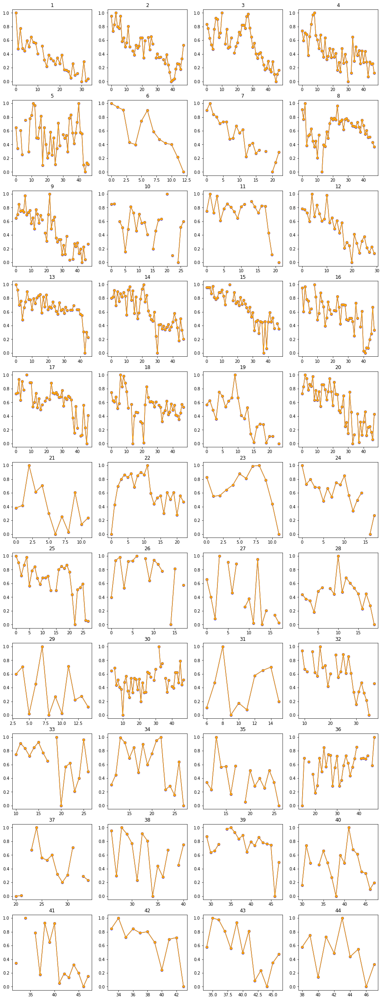

In [263]:
plot_traces(mv1.prot, mv1.prot)

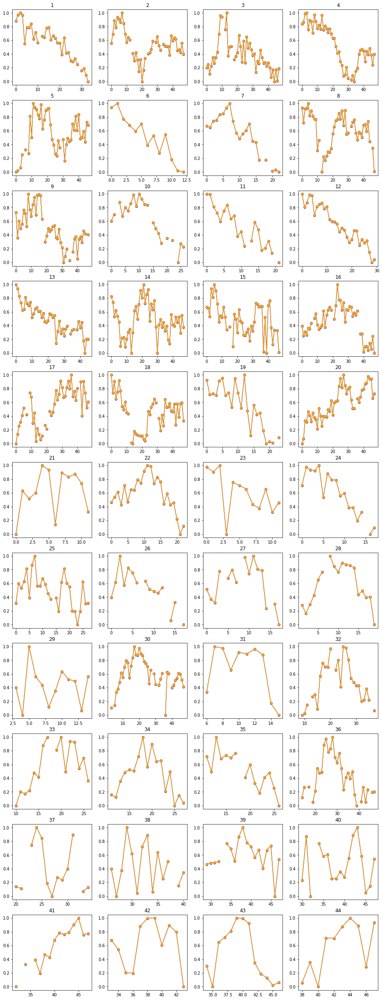

In [264]:
plot_traces(mv1.intvol, mv1.intvol)

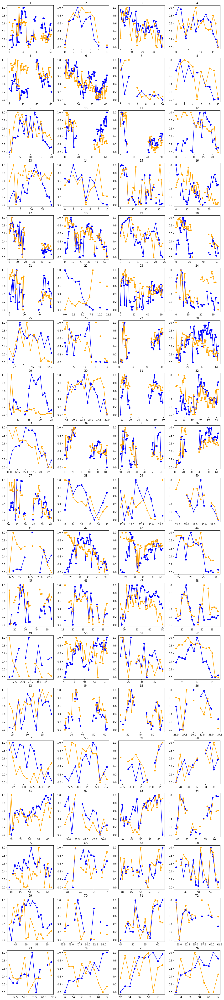

In [271]:
plot_traces(mv2.intvol, mv2.prot)

In [268]:
imp.quickview_ms2(mv2.stack, mv2.spot_data, 1,35)

interactive(children=(Dropdown(description='Color', index=8, options=('gray_r', 'viridis', 'cividis', 'magma',…

In [270]:
imp.quickview_ms2(mv2.stack, mv2.spot_data, 0,31)

interactive(children=(Dropdown(description='Color', index=8, options=('gray_r', 'viridis', 'cividis', 'magma',…

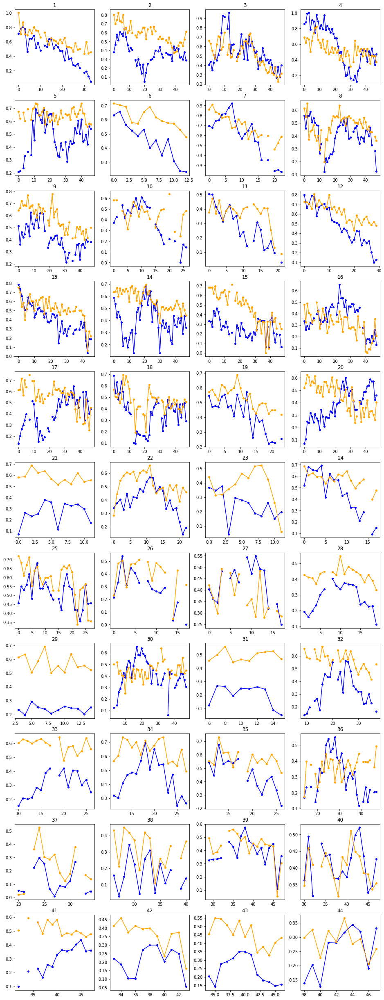

In [8]:
plot_traces2(mv1.intvol, mv1.prot)

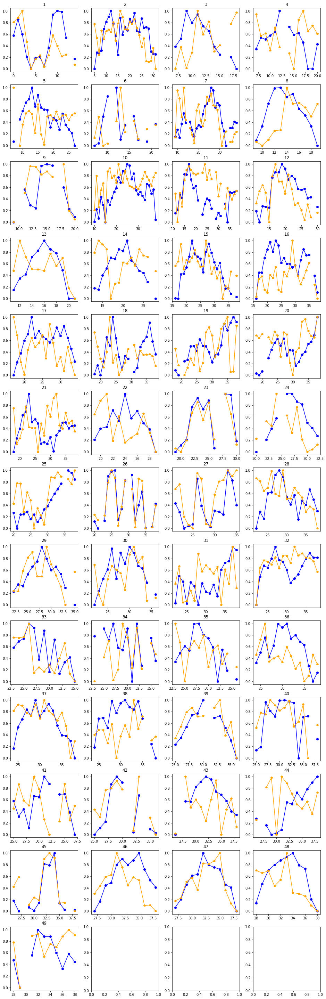

In [316]:
plot_traces(mv3.intvol, mv3.prot)

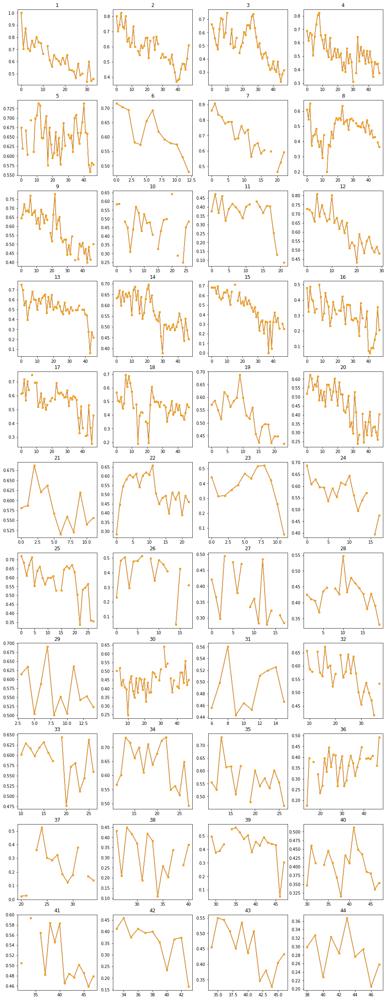

In [313]:
plot_traces2(mv1.prot, mv1.prot)

In [314]:
mv8 = load_pickle('/Users/MStadler/Bioinformatics/Projects/Zelda/Quarantine_analysis/results/20200811-em2-zsmv-08.pkl')

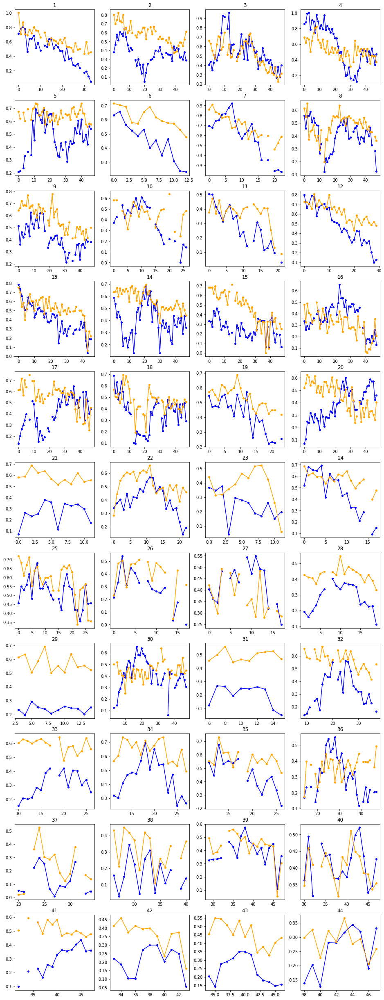

In [46]:
plot_traces2(mv1.intvol, mv1.prot)

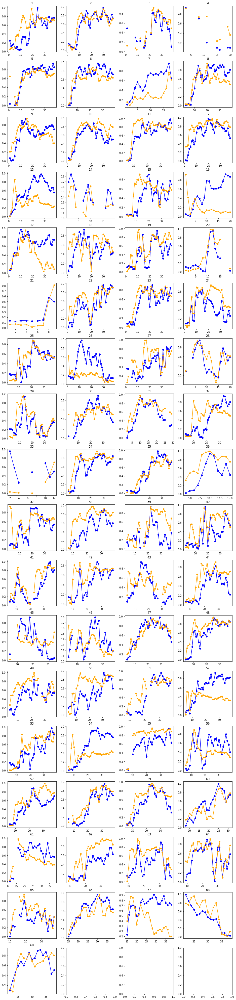

In [11]:
plot_traces_base(mv1.intvol, mv1.prot, 2)

In [39]:
m = imp.spot_movies(mv1.stack, mv1.spot_data, channel=1, len_ij=31, len_z=3, fill=0, view=False)
p = imp.spot_movies(mv1.stack, mv1.spot_data, channel=0, len_ij=31, len_z=3, fill=0, view=False)

In [65]:
viewer([p.mean(axis=2),m.mean(axis=2)],8)

interactive(children=(Dropdown(description='Color', index=4, options=('gray', 'plasma', 'gray_r', 'Reds', 'Gre…

In [55]:
# simple linear bleaching correction
v=[]
channel=0
stack = mv1.stack[0]
df = mv1.prot.copy()
for t in range(0, stack.shape[0]):
    v.append(np.mean(stack[t]))

#stack_corr = stack.copy()
for i in range(0, len(v)):
    corr = max(v) - v[i]
    df.iloc[i] = df.iloc[i] + corr


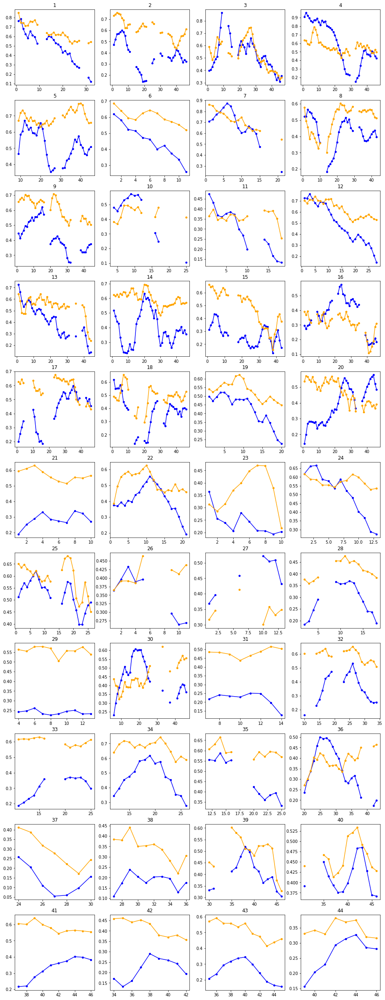

In [63]:
plot_traces2(mv1.intvol, df, 3)

SpearmanrResult(correlation=0.41458086835580643, pvalue=1.758517425693258e-49)
(0.4780727053363883, 2.119526128167801e-67)
SpearmanrResult(correlation=0.4012117298733458, pvalue=3.589262304216819e-46)
(0.45679927422207944, 5.718994213923539e-61)


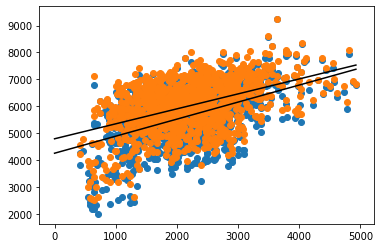

In [73]:
from scipy.stats import spearmanr, pearsonr
plot_vs(mv1.intvol, mv1.prot)
plot_vs(mv1.intvol, df)

In [8]:
def plot_traces2(table1, table2, windowsize=1):
    """Compare two integrations using grand min and max to normalize"""
    num_to_plot= table1.shape[1]
    
    def norm(data, x):
        # Double min and max takes grand mean of the array
        data_norm = (data[x] - data.min().min()) / (data.max().max() - data.min().min())
        return(data_norm)
    
    def test(x):
        data = norm(table1, x).rolling(windowsize, center=True).mean()
        plt.plot(data.index, data.values, marker="o", color="blue", markersize=4)
        data2 = norm(table2, x).rolling(windowsize, center=True).mean()
        plt.plot(data2.index, data2.values, marker="o", color="orange", markersize=4)
        plt.title(x)
        
    imp.plot_ps(test, range(1,num_to_plot+1))

In [9]:
def plot_traces_base(table1, table2, windowsize=1):
    """Compare two integrations, normalize each trace 0 to 1"""
    num_to_plot= table1.shape[1]
    
    def norm(data, x):
        data_norm = (data[x] - data[x].min()) / (data[x].max() - data[x].min())
        return(data_norm)
    
    def test(x):
        data = norm(table1, x).rolling(windowsize, center=True).mean()
        data.plot(marker="o", color="blue") 
        #data2 = norm(table2, x)
        data2 = norm(table2, x).rolling(windowsize, center=True).mean()
        data2.plot(marker="p", color="orange")
        plt.title(x)
        
    imp.plot_ps(test, range(1,num_to_plot+1))


In [10]:
def plot_vs(data1, data2, maxval=np.inf):
    data1 = data1.copy()
    data2 = data2.copy()
    data1 = data1.to_numpy().flatten()
    data2 = data2.to_numpy().flatten()
    data1 = data1[~np.isnan(data1)]
    data2 = data2[~np.isnan(data2)]
    data1 = data1[data2 <= maxval]
    data2 = data2[data2 <= maxval]
    m, b = np.polyfit(data1, data2, 1)
    x = np.arange(0, data1.max())
    plt.scatter(data1, data2, alpha=1)
    plt.plot(x, m*x + b, color="black")
    print(spearmanr(data1, data2))
    print(pearsonr(data1, data2))

### Conclusions

This notebook got some good frameworks built, but I think it's mostly gibberish as far as conclusions. It turns out these movies weren't very well processed and things look pretty different when that is fixed up (particularly spot-detection and tracking). In the next notebook, I'm going to repeat a lot of these kinds of things with better data.